In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
#%matplotlib inline
import scipy.stats as stats
import math
import re
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.metrics import accuracy_score

Data import:

data = pd.read_csv("C:\\Users\\nicol\\OneDrive\\שולחן העבודה\\תעשיה וניהול\\שנה ד\\ML2\\FinelProject_NicoleNaamaML\\Spatial_after_droping_missing_values3.csv")
df_physiological=data.copy()
data2 = pd.read_csv("C:\\Users\\nicol\\OneDrive\\שולחן העבודה\\תעשיה וניהול\\שנה ד\\ML2\\FinelProject_NicoleNaamaML\\participation_data24.3.csv")
df_participant=data2[data2.Condition.isin(['Allocentric'])].reset_index().copy()

In [2]:
data = pd.read_csv("C:\\Users\\USER\\Desktop\\לימודים\\שנה ד\\machine_learning_project\\Spatial_after_droping_missing_values3.csv")
df_physiological=data.copy()
data2 = pd.read_csv("C:\\Users\\USER\\Desktop\\לימודים\\שנה ד\\machine_learning_project\\participation_data.csv")
df_participant=data2[data2.Condition.isin(['Allocentric'])].reset_index().copy()

In [3]:
df_participant.head(3)

,index,Id,Condition,Samples,Duration,WithinScenarioOrder,WithinIDOrder,Distance_Driven,EGOlocAtTermination,collision,...,Gender,status,license years,experience computer games,accident non-keeping distance,number of times,technologies life easier,understand technology,enjoy understanding technology,experience simulator
0,0,A1_012594,Allocentric,4677.0,277.0,2,11,1038.695827,end Right turn into the parking lot,0,...,Male,תואר ראשון - שנה שניה,7.0,לא,לא,0,5,4,4,לא
1,1,A1_018183,Allocentric,4473.0,242.0,2,11,1049.637800,end Right turn into the parking lot,0,...,Male,תואר ראשון - שנה שניה,5.0,כן,לא,0,5,4,5,לא
2,2,A1_036689,Allocentric,4397.0,239.0,2,11,1025.427112,end Right turn into the parking lot,0,...,Female,תואר ראשון - שנה שניה,6.0,לא,לא,0,4,3,5,לא


df_physiological.head(3)

---------

start with pre-process of the physiological data:

In [4]:
df_physiological.columns

Index(['Accelerometer_X', 'Accelerometer_X.1', 'Accelerometer_Y',
       'Accelerometer_Y.1', 'Accelerometer_Z', 'Accelerometer_Z.1', 'Alpha1',
       'Alpha1.1', 'Alpha10', 'Alpha10.1',
       ...
       'Time-M', 'Time-M.1', 'Time-M.1.1', 'Time-M.1.2', 'Time-S', 'Time-S.1',
       'Time-S.1.1', 'Time-S.1.2', 'Tobiiquality', 'Tobiiquality.1'],
      dtype='object', length=307)

In [5]:
df_physiological.shape

(181, 307)

correcting columns names and numeric them

In [6]:
df_physiological = df_physiological.iloc[1:]  # Remove this line if not needed

for col in df_physiological.columns:
    if '.1' in col:
        new_col = col.replace(".1", '_sd')
    elif col != 'Id':
        new_col = col + '_mean'
    else:
        continue
    
    # Rename the column
    df_physiological = df_physiological.rename(columns={col: new_col})
    
    # Convert the column to numeric
    df_physiological[new_col] = pd.to_numeric(df_physiological[new_col], errors='coerce')

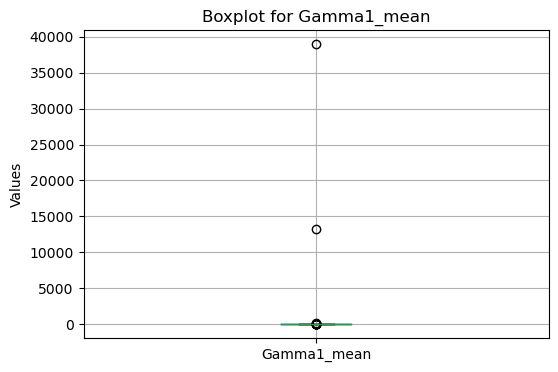

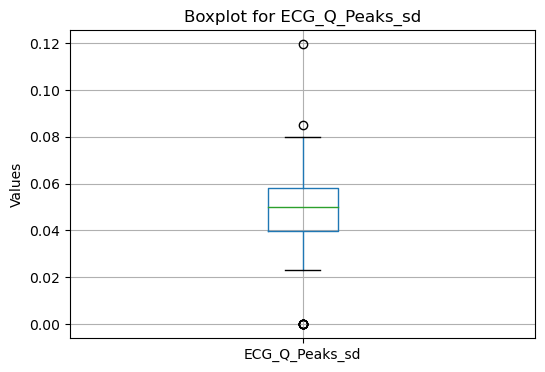

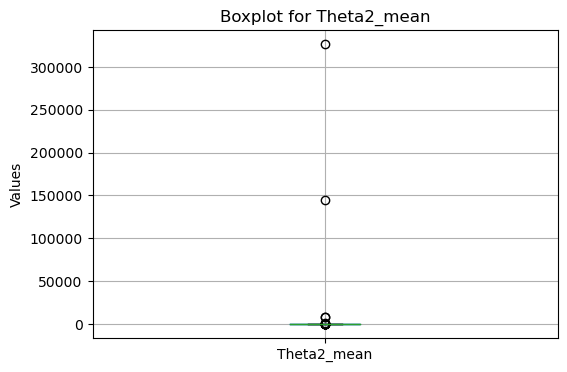

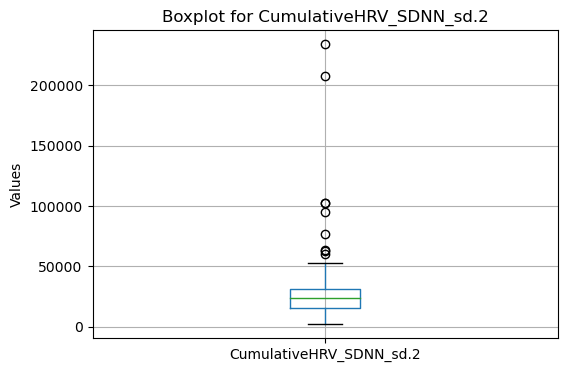

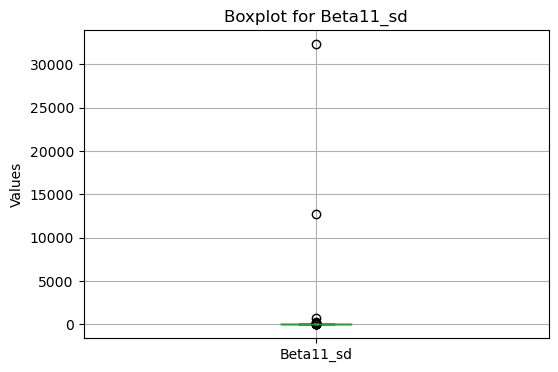

...

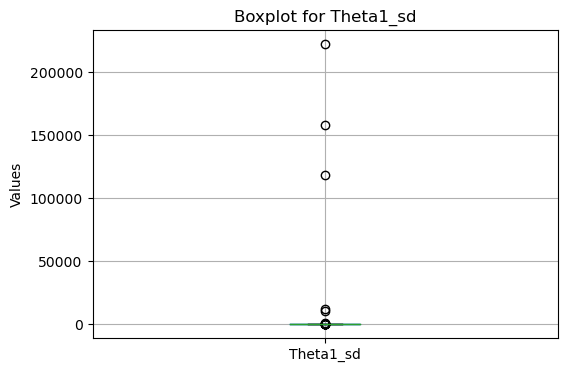

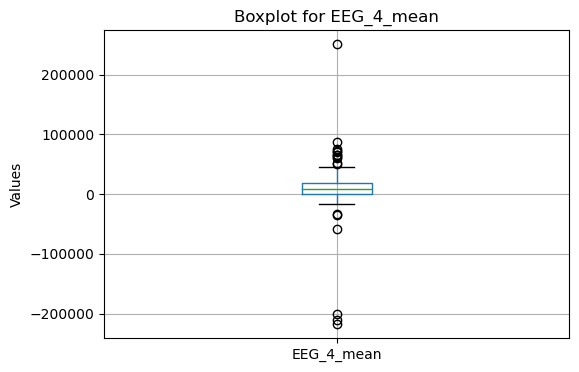

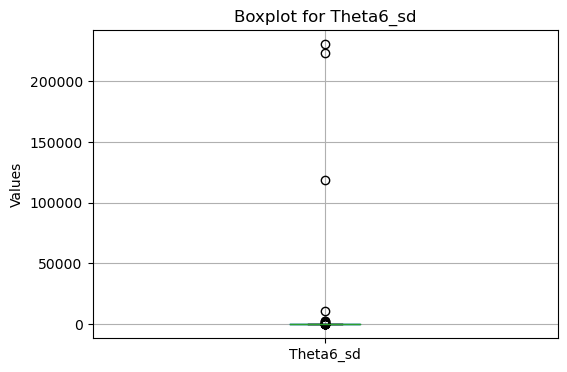

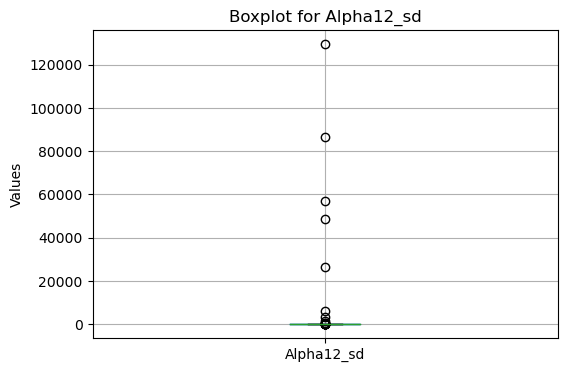

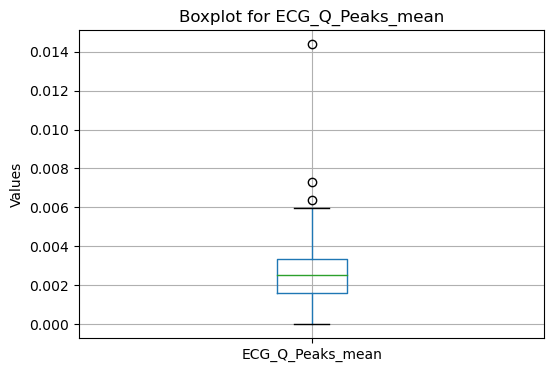

In [7]:
random_columns = np.random.choice(df_physiological.columns, size=20, replace=False)

# Step 2: Check if selected columns contain numerical data
numerical_columns = df_physiological[random_columns].select_dtypes(include=np.number).columns

# Step 3: Plot boxplots for each numerical column separately
for col in numerical_columns:
    df_physiological[[col]].boxplot(figsize=(6, 4))
    plt.title(f'Boxplot for {col}')
    plt.ylabel('Values')
    plt.show()

-----------------

continue with pre-process of the physiological data:

In [8]:
df_participant.shape

(227, 30)

In [9]:
df_participant.Id.info()

<class 'pandas.core.series.Series'>
RangeIndex: 227 entries, 0 to 226
Series name: Id
Non-Null Count  Dtype 
--------------  ----- 
227 non-null    object
dtypes: object(1)
memory usage: 1.9+ KB


Creating a new column whether a graduation track participant or not

In [10]:
# The locations considered as scenario end points
end_list = ['end Right turn into the parking lot', 'start Right turn into the parking lot']

# True= finish the scenario
# False= didn't finish the scenario
df_participant['Finished'] = df_participant['EGOlocAtTermination'].isin(end_list)#.astype(int)

In [12]:
# Define a mapping dictionary for EGOlocAtTermination
ego_loc_mapping = {'start Right turn ': 1, 
                   'start Left turn at an intersection with stop sign 1': 2, 
                   'end Left turn at an intersection with stop sign 1': 3, 
                   'end Left turn at an intersection with stop sign 1': 4, 
                   'start Left turn at an intersection with stop sign 2': 5, 
                   'end Left turn at an intersection with stop sign 2': 6, 
                   'start Overtaking a vehicle oncoming traffic': 7,
                   'end Overtaking a vehicle oncoming traffic': 8,
                   'start Left turn on a curve 1': 9,
                   'start Overtaking a work zone oncoming traffic': 10,                   
                   'Overtaking a work zone oncoming traffic': 11,
                   'Car overtaking a work zone': 11,
                   'end Overtaking a work zone oncoming traffic': 12,
                   'start Left turn on a curve 2': 13,
                  'end Left turn on a curve 2': 14,
                  'start Left turn at an intersection': 15,
                  'start Pedestrian crosses unexpectedly': 16,
                  'end Pedestrian crosses unexpectedly': 17,
                  'start Right turn into the parking lot': 18,
                  'end Right turn into the parking lot': 19
                  }  # Add more values as needed

# Map the EGOlocAtTermination column to numerical values using the mapping dictionary
df_participant['EGOlocAtTermination'] = df_participant['EGOlocAtTermination'].map(ego_loc_mapping)

'experience simulator' -

In [13]:
df_participant['experience simulator'].unique()

array(['לא',
       'כן, בצבא הביאו לא מעט פעמים סימולטור נהיגה על מנת להמחיש תחושה של נהיגה בשכרות והסחות דעת. ',
       'כן, עובדת במעבדה', 'כן, gta, need for speed , pubg',
       'כן, אור ירוק', 'לא, אין ניסיון קודם',
       'כן עשיתי את הניסוי פעם אחת', 'לא ',
       "לא משהו מיוחד, קורס נהיגה זהירה בתיכון לכמה דק'",
       'כן. בצבא במספר קורסים מבצעיים',
       'כן, עברתי סימולטור נהיגה של טנקים בשריון', 'אין ניסיון',
       'כן בתור ילד', 'כן סימולטור שמדמה התהפכות ברכב ',
       'ביצעתי סימולטור של איזושהי עמותה בתיכון', 'אין',
       'ניסיון ביתי,תחרויות מירוצים', 'משחקי מחשב',
       'כן, נהיגה ברכב הניסוי',
       'סימולטור נהיגה וטיסה - לא ניסיון מקצועי (משחקים).', 'כן'],
      dtype=object)

In [14]:
def TextTo_Yes1_No0(answer):
    if pd.isna(answer): # for NaN values 
        return 0    
    elif 'כן' in str(answer):
        return 1
    elif answer in ['אין ניסיון', 'אין', 'לא', 'ללא ניסיון','.לא','כמעט ולא', 'לא.','לא, אין ניסיון']:
        return 0
    else:
        return 1

In [15]:
df_participant['experience simulator']=df_participant['experience simulator'].apply(TextTo_Yes1_No0)

In [16]:
#Check that we have taken care of all the values
df_participant['experience simulator'].unique()

array([0, 1], dtype=int64)

'experience computer games' -

In [17]:
df_participant['experience computer games'].unique()

array(['לא', 'כן', 'כן מעט', 'אין ניסיון', 'כן.', 'כן need for speed',
       'כן, משחקים בסמארטפון.', 'כן זוהי שאלה כפולה ',
       'כן, nned for speed', 'כן שיחקתי בעבר עם הגה חיצוני', '0',
       'מעט מאוד', 'כן שיחקתי בNEEDFOR SPEED עם הגה',
       'קצת שיחקתי בneed for speed', 'לא.', 'כן... הייתי משחק הרבה כילד',
       'כן,שיחקתי בעבר בתור ילד ', 'כן, רק need for speed', 'Gta',
       'כן שחקתי מעט ', 'כן ', 'כן כל מיני משחקים אבל אני לא גיימר',
       'כן F1 PlayStation', 'כן שיחקתי בXBOX',
       'רק בשנות החטיבה/תחילת תיכון', 'GTA', 'מעט כילד',
       'כן, מעט משחקים כמו f1 בטלפון (בודדים במהלך השנים)',
       'כן , שיחקתי קצת בילדות ', 'קצת ממש', 'מעט', '8',
       'מעט נסיון, שיחקתי בעבר כמה פעמים',
       'כן, need for speed ו gta בעבר הרחוק', 'אין',
       'כן יש ניסיון במספר רחב של משחקי מירוצים למינהם כולל סימולציות',
       'כן, יש כמה משחקים במחשב', 'כן, בתור ילד שיחקתי', 'ממש קצת',
       'כן, need for speed', 'לא, אין ניסיון', 'כן, הרבה',
       'מעט, בתור ילד שיחקתי

In [18]:
df_participant['experience computer games']=df_participant['experience computer games'].apply(TextTo_Yes1_No0)

In [19]:
#Check that we have taken care of all the values
df_participant['experience computer games'].unique()

array([0, 1], dtype=int64)

'number of times' -

In [20]:
df_participant['number of times'].unique()

array(['0', '1', 'פעם אחת', 'פעמיים', 'לא', '2'], dtype=object)

In [21]:
def TextTo_numeric(answer):
    if pd.isna(answer) or answer=='לא': # for NaN values 
        return 0    
    elif answer=='פעם אחת':
        return 1
    elif answer=='פעמיים':
        return 2

    else:
        return int(answer)

In [22]:
df_participant['number of times']=df_participant['number of times'].apply(TextTo_numeric)

In [23]:
#Check that we have taken care of all the values
df_participant['number of times'].unique()

array([0, 1, 2], dtype=int64)

'accident non-keeping distance'-

In [24]:
df_participant['accident non-keeping distance'].unique()

array(['לא', 'כן'], dtype=object)

In [25]:
df_participant['accident non-keeping distance'] = df_participant['accident non-keeping distance'].replace({'כן': 1, 'לא': 0})


# If they didn't answer, it's probably because they haven't had an accident in the past >> 0
df_participant['accident non-keeping distance'].fillna(0, inplace=True)

In [26]:
#Check that we have taken care of all the values
df_participant['accident non-keeping distance'].unique()

array([0, 1], dtype=int64)

----------------------------

Connecting data

In [28]:
merged_df = pd.merge(df_physiological, df_participant, on='Id', how='inner')
merged_df.shape

(182, 337)

----------------------------------------

In [31]:
df_model_test2=merged_df.copy()
df_model_test2.head()

,Accelerometer_X_mean,Accelerometer_X_sd,Accelerometer_Y_mean,Accelerometer_Y_sd,Accelerometer_Z_mean,Accelerometer_Z_sd,Alpha1_mean,Alpha1_sd,Alpha10_mean,Alpha10_sd,...,status,license years,experience computer games,accident non-keeping distance,number of times,technologies life easier,understand technology,enjoy understanding technology,experience simulator,Finished
0,-0.274523,0.333093,-9.840654,0.112385,-1.556116,0.422059,42.004760,122.513039,2.618049,2.090590,...,תואר ראשון - שנה שניה,7.0,0,0,0,5,4,4,0,True
1,-1.322098,0.842439,-9.308377,0.196647,-2.941219,0.451870,12528.819720,56913.679790,8.960530,66.216599,...,תואר ראשון - שנה שניה,6.0,0,0,0,4,3,5,0,True
2,-0.153135,0.405352,-9.776648,0.096275,-1.393561,0.255201,0.000998,0.000466,0.000671,0.000361,...,תואר ראשון - שנה שלישית,7.0,0,0,0,5,4,5,0,True
3,-0.804803,0.570084,-9.304457,0.237502,-3.175001,0.560341,2.938056,3.222528,1.903778,1.352602,...,תואר ראשון - שנה שלישית,7.0,0,0,0,3,2,3,0,False
4,0.470823,0.403299,-9.651853,0.145865,-2.148001,0.411913,0.000659,0.000411,0.000590,0.000368,...,תואר ראשון - שנה שניה,9.0,0,0,0,5,4,5,0,True


In [32]:
col_list = df_model_test2.isnull().sum()#.tolist()
counter = 0
for col in col_list:
    counter += col
print('Missing value count:', counter)

Missing value count: 5550


In [33]:
df_model_test2.shape

(182, 337)

In [49]:
df = df_model_test2.drop(columns=['Id','Condition']).copy()

Building the model

In [52]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA, KernelPCA, FastICA
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.impute import SimpleImputer
from sklearn.model_selection import ParameterGrid
from sklearn.feature_selection import VarianceThreshold


def preprocess_data(df):
    # Separate numerical and categorical features
    numerical_features = df.select_dtypes(include=['int64', 'float64']).columns
    categorical_features = df.select_dtypes(include=['object']).columns
    
    # Fill missing values for numerical features with median
    imputer_numerical = SimpleImputer(strategy='median')
    df[numerical_features] = imputer_numerical.fit_transform(df[numerical_features].values)
    
    # Fill missing values for categorical features with most frequent value
    imputer_categorical = SimpleImputer(strategy='most_frequent')
    df[categorical_features] = imputer_categorical.fit_transform(df[categorical_features].values)
    
    # One-hot encode categorical features
    encoder = OneHotEncoder()
    encoded_categorical = encoder.fit_transform(df[categorical_features])
    
    # Standardize numerical features
    scaler = StandardScaler()
    standardized_numerical = scaler.fit_transform(df[numerical_features])
    
    # Get feature names after one-hot encoding
    feature_names_categorical = encoder.get_feature_names_out(input_features=categorical_features)
    
    # Combine encoded categorical and standardized numerical features
    preprocessed_data = pd.concat([pd.DataFrame(standardized_numerical, columns=numerical_features),
                                   pd.DataFrame(encoded_categorical.toarray(), columns=feature_names_categorical)], axis=1)
    
    return preprocessed_data

def evaluate_DBSCAN(X, feature_selection):
    best_silhouette = -1
    best_params = {}
    best_dbi = float('inf')
    best_chi = -1
    
    # Define parameter grid for DBSCAN parameters
    param_grid = {'eps': [0.1, 0.5, 1.0],
                  'min_samples': [2, 5, 10]}
    
    # Generate combinations of parameters
    grid = ParameterGrid(param_grid)
    
    for params in grid:
        dbscan = DBSCAN(**params)
        clustering_labels = dbscan.fit_predict(feature_selection.fit_transform(X))
        unique_labels = len(set(clustering_labels))
        if unique_labels > 1:
            silhouette = silhouette_score(X, clustering_labels)
            dbi = davies_bouldin_score(X, clustering_labels)
            chi = calinski_harabasz_score(X, clustering_labels)
            if silhouette > best_silhouette and unique_labels > 1:
                best_silhouette = silhouette
                best_params = params
                best_dbi = dbi
                best_chi = chi
                
                # Plot clusters
#                plot_clusters(X, clustering_labels, "DBSCAN Clustering")

        # חישוב מספר האשכולות השונות
        num_clusters = len(set(clustering_labels)) - (1 if -1 in clustering_labels else 0)
        if num_clusters > 1:
            print("number of clusters:", num_clusters)

    return best_silhouette, best_params, best_dbi, best_chi

# Load your data into DataFrame 'df'
# Example:
# df = pd.read_csv('your_data.csv')

# Preprocess the data
preprocessed_data = preprocess_data(df)

variance_threshold = VarianceThreshold()
pca = PCA(n_components=3)
kernel_pca = KernelPCA(n_components=3, kernel='rbf')
ica = FastICA(n_components=3)

# DBSCAN with PCA feature selection

silhouette_pca, best_params_pca, dbi_pca, chi_pca = evaluate_DBSCAN(preprocessed_data, pca)
print("Silhouette score with PCA:", silhouette_pca)
print("Davies-Bouldin Index with PCA:", dbi_pca)
print("Calinski-Harabasz Index with PCA:", chi_pca)
print("Best parameters for PCA:", best_params_pca)

# DBSCAN with Kernel PCA feature selection

silhouette_kernel_pca, best_params_kernel_pca, dbi_kernel_pca, chi_kernel_pca = evaluate_DBSCAN(preprocessed_data, kernel_pca)
print("Silhouette score with Kernel PCA:", silhouette_kernel_pca)
print("Davies-Bouldin Index with Kernel PCA:", dbi_kernel_pca)
print("Calinski-Harabasz Index with Kernel PCA:", chi_kernel_pca)
print("Best parameters for Kernel PCA:", best_params_kernel_pca)

# DBSCAN with ICA feature selection

silhouette_ica, best_params_ica, dbi_ica, chi_ica = evaluate_DBSCAN(preprocessed_data, ica)
print("Silhouette score with ICA:", silhouette_ica)
print("Davies-Bouldin Index with ICA:", dbi_ica)
print("Calinski-Harabasz Index with ICA:", chi_ica)
print("Best parameters for ICA:", best_params_ica)

number of clusters: 2
number of clusters: 22
number of clusters: 12
number of clusters: 3
number of clusters: 2
Silhouette score with PCA: -0.07652524597918654
Davies-Bouldin Index with PCA: 5.507782105073034
Calinski-Harabasz Index with PCA: 1.5618650918547279
Best parameters for PCA: {'eps': 1.0, 'min_samples': 5}
number of clusters: 13
number of clusters: 6
number of clusters: 2
Silhouette score with Kernel PCA: -0.07856226695805253
Davies-Bouldin Index with Kernel PCA: 4.288068756204044
Calinski-Harabasz Index with Kernel PCA: 6.789848119206354
Best parameters for Kernel PCA: {'eps': 0.1, 'min_samples': 10}
number of clusters: 3


C:\Users\USER\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:542: FutureWarning: Starting 

Silhouette score with ICA: 0.8084066110799972
Davies-Bouldin Index with ICA: 0.1285758695727174
Calinski-Harabasz Index with ICA: 49.104386587100315
Best parameters for ICA: {'eps': 0.5, 'min_samples': 2}


C:\Users\USER\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


In [54]:
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.feature_selection import VarianceThreshold

# Function to evaluate KMeans clustering
def evaluate_KMeans(X, feature_selection):
    best_silhouette = -1
    best_params = {}
    best_dbi = float('inf')
    best_chi = -1
    
    # Define parameter grid for KMeans parameters
    param_grid = {'n_clusters': [2, 3, 4, 5, 6]}
    
    # Generate combinations of parameters
    grid = ParameterGrid(param_grid)
    
    for params in grid:
        kmeans = KMeans(**params)
        clustering_labels = kmeans.fit_predict(feature_selection.fit_transform(X))
        unique_labels = len(set(clustering_labels))
        if unique_labels > 1:
            silhouette = silhouette_score(X, clustering_labels)
            dbi = davies_bouldin_score(X, clustering_labels)
            chi = calinski_harabasz_score(X, clustering_labels)
            if silhouette > best_silhouette:
                best_silhouette = silhouette
                best_params = params
                best_dbi = dbi
                best_chi = chi

        print("number of clusters:", params['n_clusters'])
                
    return best_silhouette, best_params, best_dbi, best_chi

# Function to evaluate AgglomerativeClustering
def evaluate_AgglomerativeClustering(X, feature_selection):
    best_silhouette = -1
    best_params = {}
    best_dbi = float('inf')
    best_chi = -1
    
    # Define parameter grid for AgglomerativeClustering parameters
    param_grid = {'n_clusters': [2, 3, 4, 5, 6]}
    
    # Generate combinations of parameters
    grid = ParameterGrid(param_grid)
    
    for params in grid:
        agglom = AgglomerativeClustering(**params)
        clustering_labels = agglom.fit_predict(feature_selection.fit_transform(X))
        unique_labels = len(set(clustering_labels))
        if unique_labels > 1:
            silhouette = silhouette_score(X, clustering_labels)
            dbi = davies_bouldin_score(X, clustering_labels)
            chi = calinski_harabasz_score(X, clustering_labels)
            if silhouette > best_silhouette:
                best_silhouette = silhouette
                best_params = params
                best_dbi = dbi
                best_chi = chi

        print("number of clusters:", params['n_clusters'])
                
    return best_silhouette, best_params, best_dbi, best_chi

# Define feature selection methods
feature_selection_methods = [
    ('pca', PCA(n_components=2)),
    ('kernel_pca', KernelPCA(n_components=3, kernel='rbf')),# Principal Component Analysis
    ('ica', FastICA(n_components=2))  # Independent Component Analysis
]

# Define clustering models
clustering_models = [
    ('KMeans', evaluate_KMeans),
    ('AgglomerativeClustering', evaluate_AgglomerativeClustering)
]

# Preprocess the data
preprocessed_data = preprocess_data(df)

# Evaluate clustering for each model and feature selection method
for model_name, evaluate_model in clustering_models:
    for method_name, method in feature_selection_methods:
        print(f"Evaluating {model_name} with {method_name} feature selection...")
        silhouette, best_params, dbi, chi = evaluate_model(preprocessed_data, method)
        print(f"Silhouette score: {silhouette}")
        print(f"Davies-Bouldin Index: {dbi}")
        print(f"Calinski-Harabasz Index: {chi}")
        print()
        


Evaluating KMeans with pca feature selection...


C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


number of clusters: 2


C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


number of clusters: 3


C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


number of clusters: 4


C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


number of clusters: 5


C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


number of clusters: 6
Silhouette score: 0.7467371878809147
Davies-Bouldin Index: 0.6393971961551664
Calinski-Harabasz Index: 49.37658929662677
Best parameters: {'n_clusters': 2}

Evaluating KMeans with kernel_pca feature selection...


C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


number of clusters: 2


C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


number of clusters: 3


C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


number of clusters: 4


C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


number of clusters: 5


C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


number of clusters: 6
Silhouette score: 0.22248946908857162
Davies-Bouldin Index: 5.27998487315538
Calinski-Harabasz Index: 5.153184155089687
Best parameters: {'n_clusters': 2}

Evaluating KMeans with ica feature selection...


C:\Users\USER\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


number of clusters: 2


C:\Users\USER\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


number of clusters: 3


C:\Users\USER\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


number of clusters: 4


C:\Users\USER\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


number of clusters: 5


C:\Users\USER\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


number of clusters: 6
Silhouette score: 0.8084066110799972
Davies-Bouldin Index: 0.1285758695727174
Calinski-Harabasz Index: 49.104386587100315
Best parameters: {'n_clusters': 2}

Evaluating AgglomerativeClustering with pca feature selection...
number of clusters: 2
number of clusters: 3
number of clusters: 4
number of clusters: 5
number of clusters: 6
Silhouette score: 0.7467371878809147
Davies-Bouldin Index: 0.6393971961551664
Calinski-Harabasz Index: 49.37658929662677
Best parameters: {'n_clusters': 2}

Evaluating AgglomerativeClustering with kernel_pca feature selection...
number of clusters: 2
number of clusters: 3
number of clusters: 4
number of clusters: 5
number of clusters: 6
Silhouette score: 0.26682206485801824
Davies-Bouldin Index: 4.799206583483923
Calinski-Harabasz Index: 6.027789553410827
Best parameters: {'n_clusters': 2}

Evaluating AgglomerativeClustering with ica feature selection...
number of clusters: 2
number of clusters: 3
number of clusters: 4
number of clusters

C:\Users\USER\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


C:\Users\USER\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


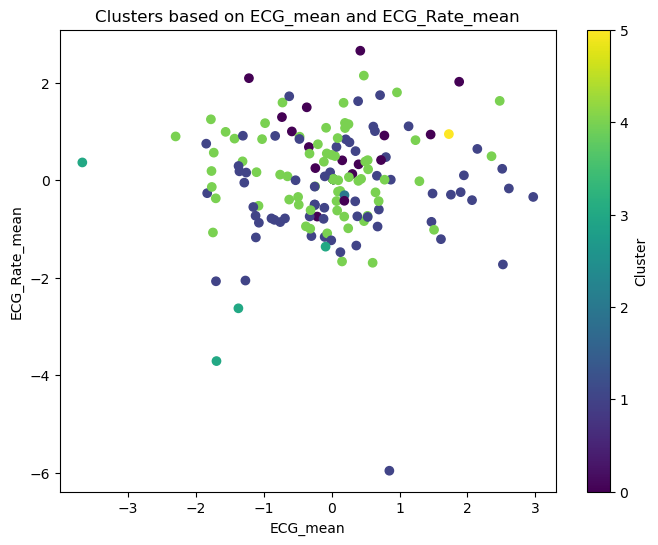

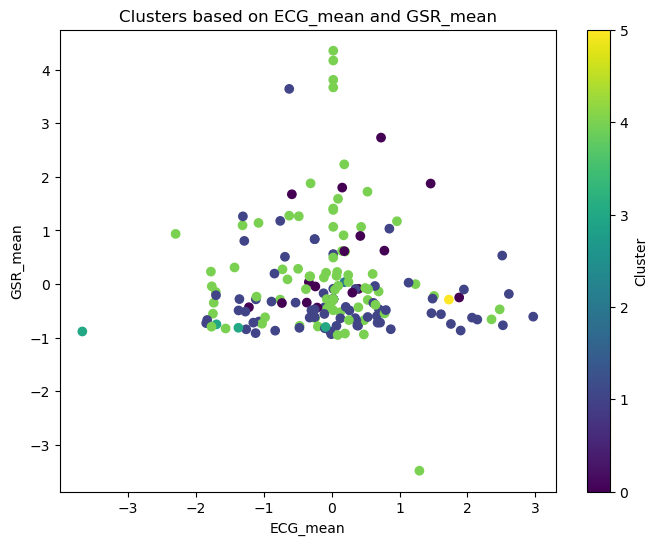

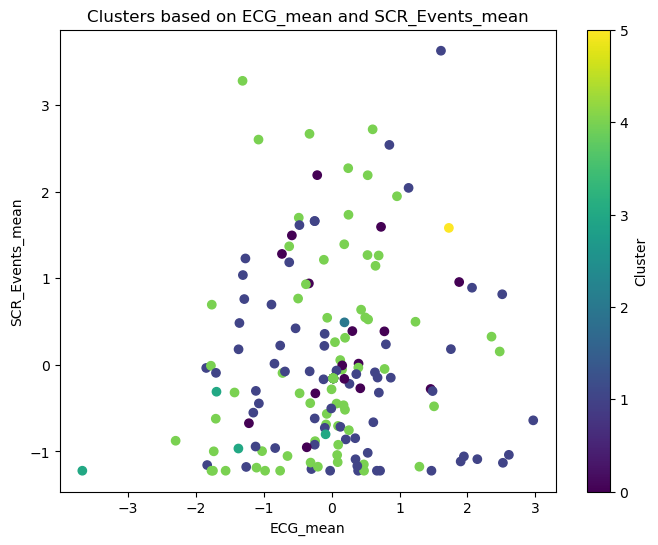

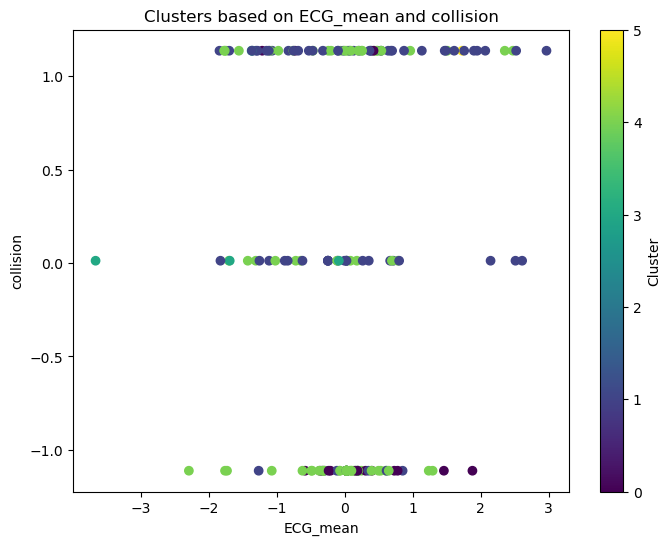

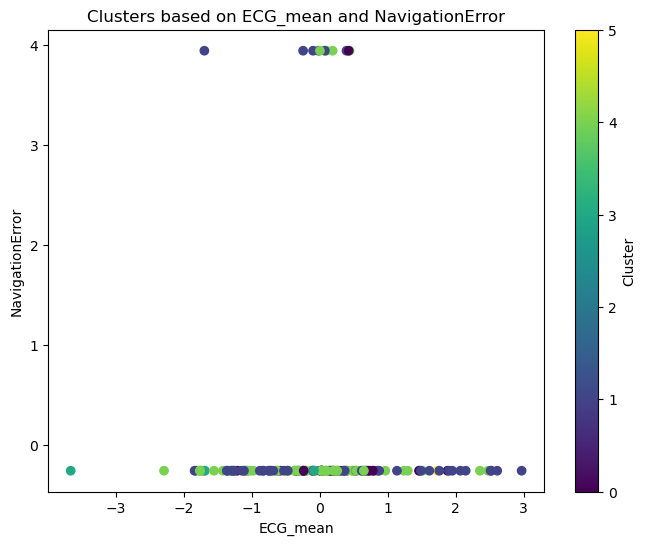

...

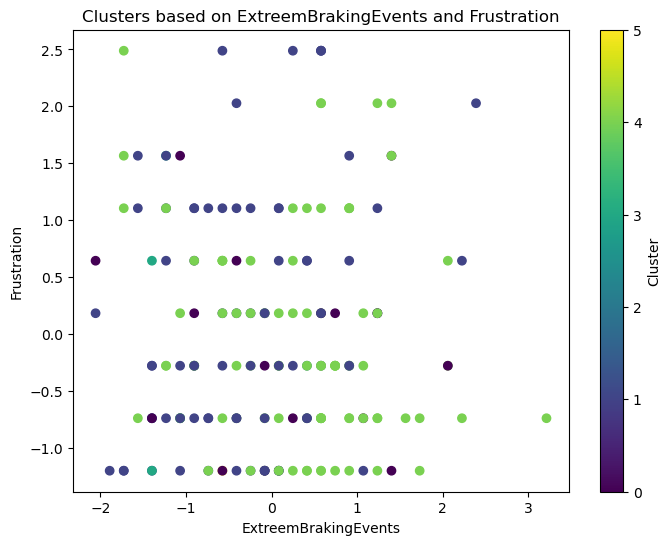

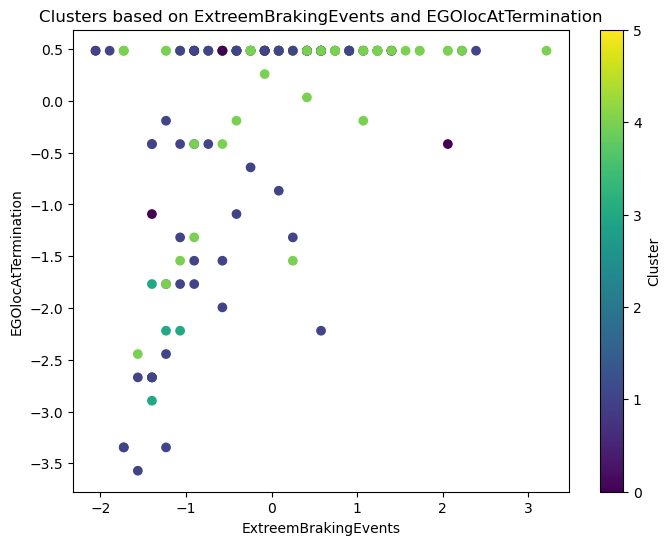

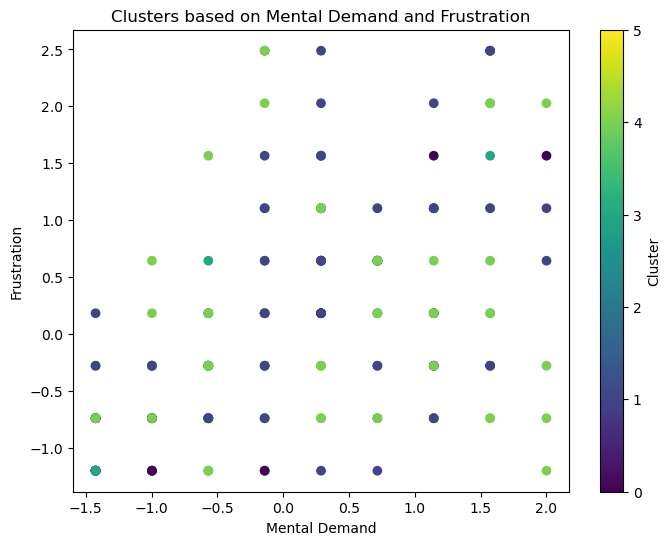

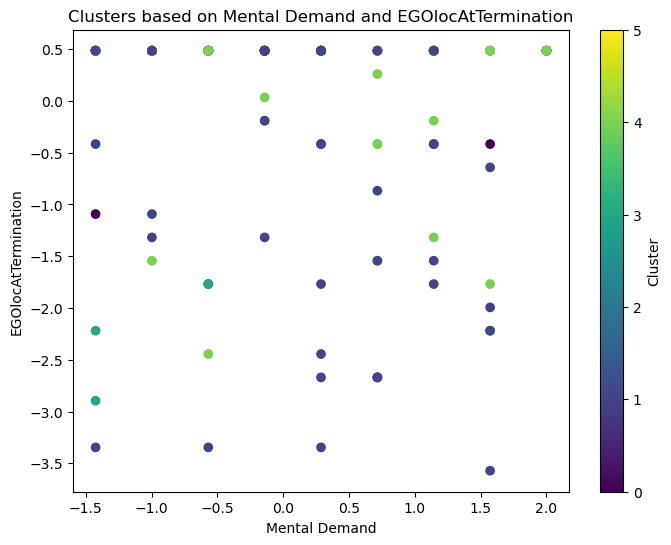

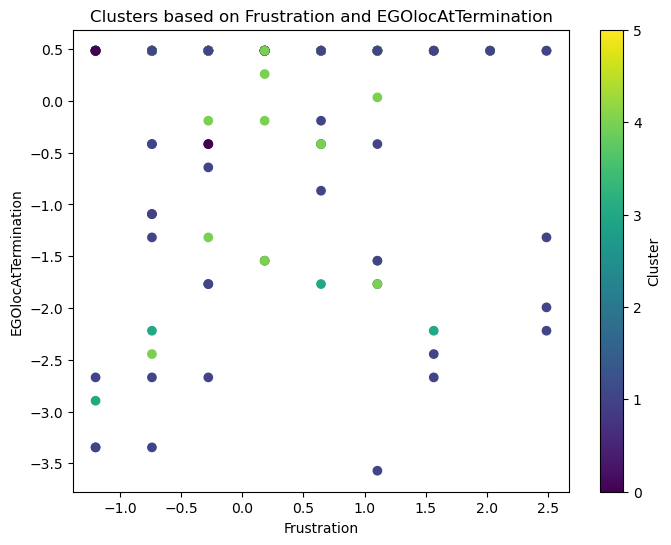

In [56]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import VarianceThreshold
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler

columns_of_interest = ['ECG_mean','ECG_Rate_mean','GSR_mean','SCR_Events_mean',
                       'collision','NavigationError','ExtreemBrakingEvents','Mental Demand',
                       'Frustration','EGOlocAtTermination'] 
subset_data = preprocessed_data[columns_of_interest]

# Define Feature Selection and Clustering Model
feature_selector = FastICA(n_components=2)
clustering_model = KMeans(n_clusters=6)  # Adjust parameters as needed

# Create Pipeline
pipeline = Pipeline(steps=[
    ('feature_selector', feature_selector),
    ('clustering_model', clustering_model)
])

# Fit Pipeline
pipeline.fit(preprocessed_data)

# Predict Clusters
cluster_labels = pipeline['clustering_model'].labels_

# Plot clusters for each pair of columns
for i in range(len(columns_of_interest)):
    for j in range(i + 1, len(columns_of_interest)):
        plt.figure(figsize=(8, 6))
        plt.scatter(subset_data.iloc[:, i], subset_data.iloc[:, j], c=cluster_labels, cmap='viridis')
        plt.xlabel(columns_of_interest[i])
        plt.ylabel(columns_of_interest[j])
        plt.title(f'Clusters based on {columns_of_interest[i]} and {columns_of_interest[j]}')
        plt.colorbar(label='Cluster')
        plt.show()

        

C:\Users\USER\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\USER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


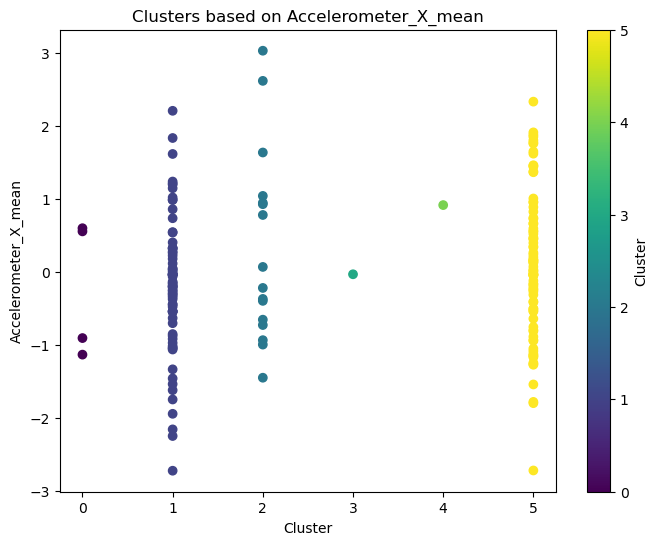

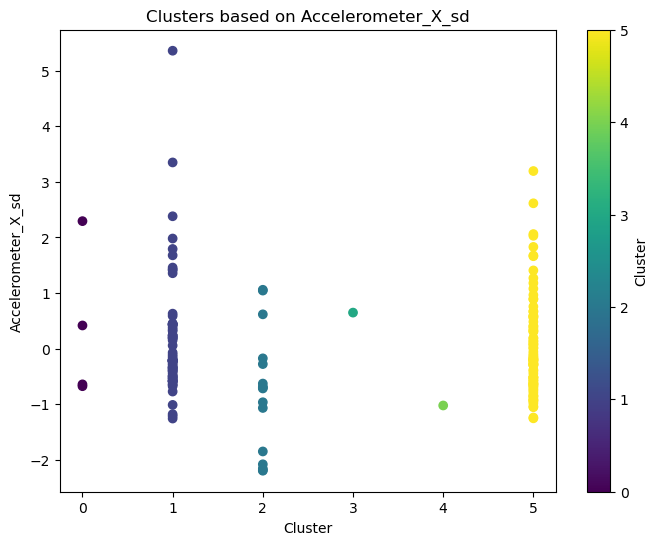

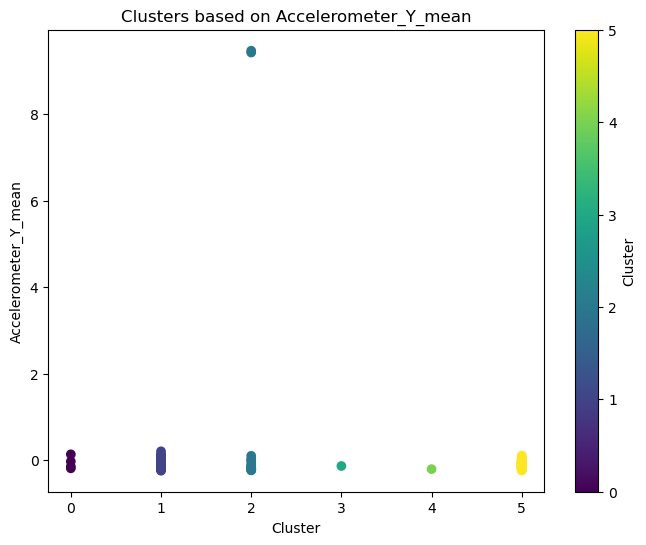

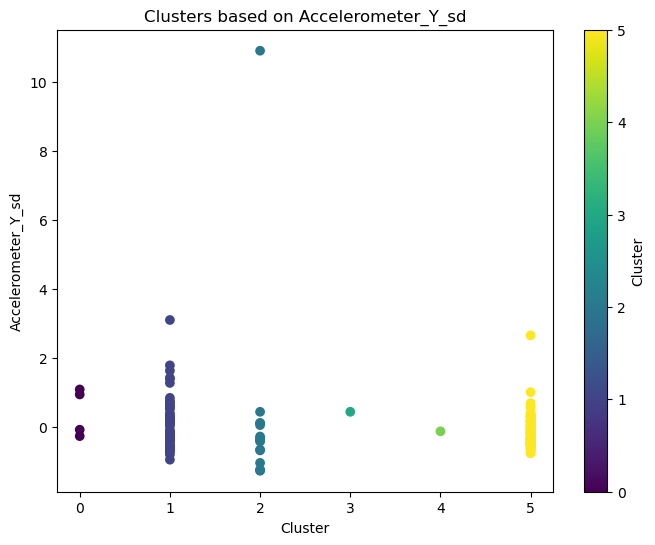

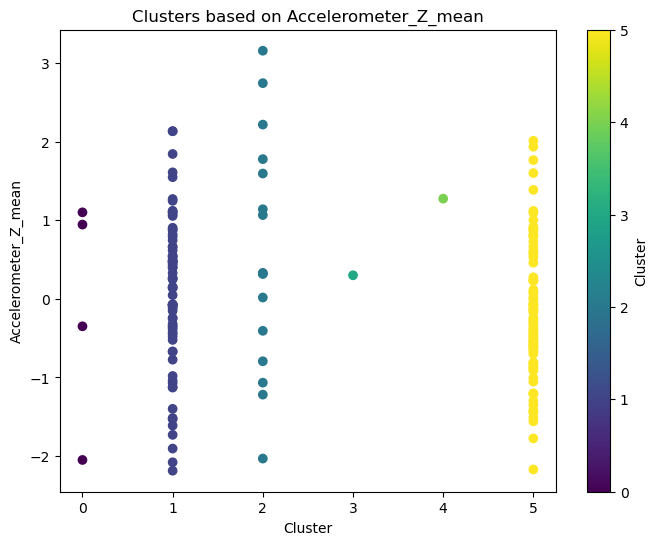

...

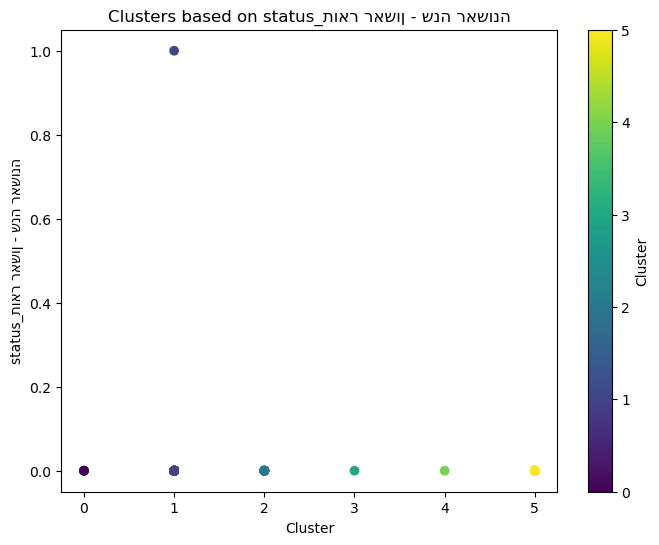

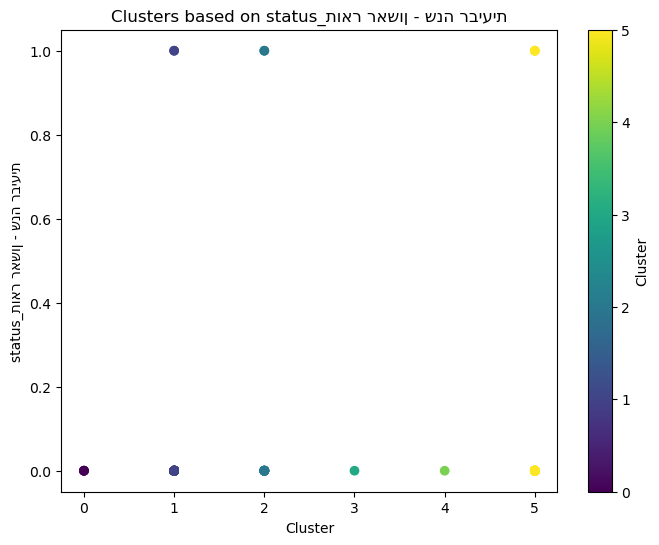

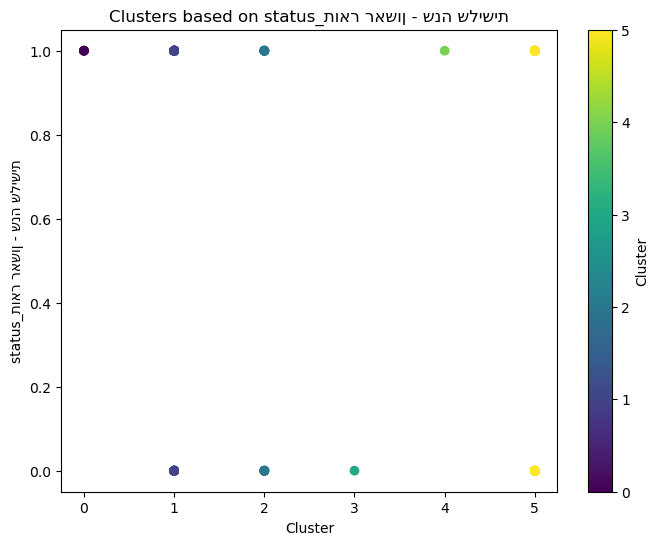

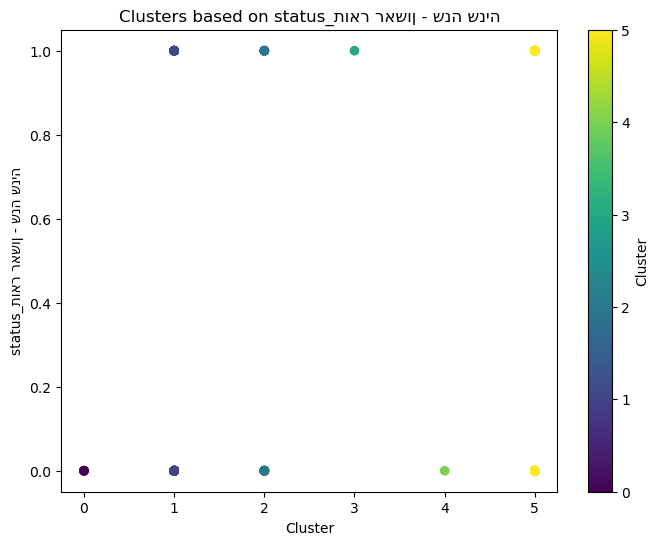

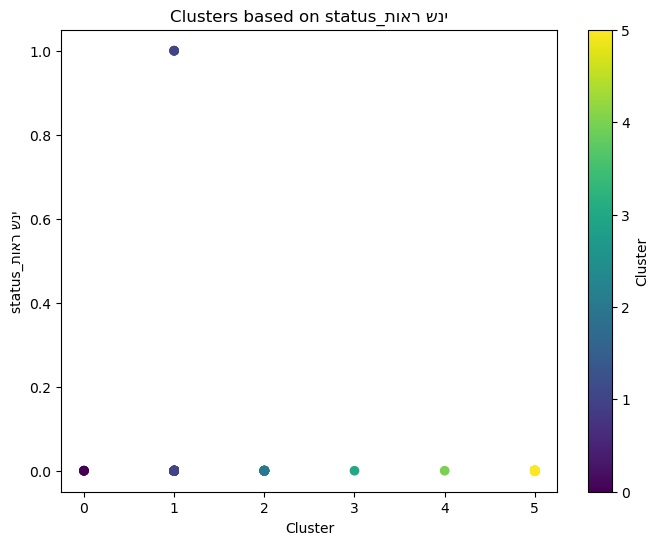

In [48]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.decomposition import FastICA  # Import FastICA from sklearn.decomposition
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

columns_of_interest = preprocessed_data.columns#['ECG_mean','ECG_Rate_mean','GSR_mean','SCR_Events_mean',
                      # 'collision','NavigationError','ExtreemBrakingEvents','Mental Demand','HRV_HF_mean'
                     #  'Frustration','EGOlocAtTermination'] 
subset_data = preprocessed_data #[columns_of_interest]

# Define Feature Selection and Clustering Model
feature_selector = FastICA(n_components=2)
clustering_model = KMeans(n_clusters=6)  # Adjust parameters as needed

# Create Pipeline
pipeline = Pipeline(steps=[
    ('feature_selector', feature_selector),
    ('clustering_model', clustering_model)
])

# Fit Pipeline
pipeline.fit(preprocessed_data)

# Predict Clusters
cluster_labels = pipeline['clustering_model'].labels_

# Plot clusters for each feature
for column in columns_of_interest:
    plt.figure(figsize=(8, 6))
    plt.scatter(cluster_labels, subset_data[column], c=cluster_labels, cmap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Clusters based on {column}')
    plt.colorbar(label='Cluster')
    plt.show()


## Good luck :)